In [12]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

Data Cleaning:

I processed both philosophy_data.csv and philosopher.csv to ensure consistency and accuracy. In philosophy_data.csv, I removed any missing values in the 'sentence_str' column to prevent incomplete data from affecting analysis. For philosopher.csv, I re-read the file using the correct delimiter (;) to properly separate columns. I also cleaned up column names by removing any accidental semicolons or extra whitespace. To maintain text consistency and avoid encoding issues, I removed all non-ASCII characters from string entries in the DataFrame. Then, I dropped the "Unnamed" column, which appeared to be an accidental result from improper CSV formatting. Finally, I replaced all strange symble "�" in the original file with an empty space and print out the top 5 rows to make sure the dataset is cleaned.


In [ ]:
texts_df = pd.read_csv('philosophy_data.csv')
print("Columns in philosophy_data.csv:", texts_df.columns.tolist())

sample_texts = texts_df['sentence_str'].dropna().sample(5000, random_state=42)

Columns in philosophy_data.csv: ['title', 'author', 'school', 'sentence_spacy', 'sentence_str', 'original_publication_date', 'corpus_edition_date', 'sentence_length', 'sentence_lowered', 'tokenized_txt', 'lemmatized_str']


In [ ]:
import pandas as pd

try:
    network_df = pd.read_csv('philosopher.csv', encoding='ISO-8859-1', on_bad_lines='skip')
    print("File loaded successfully!")
except Exception as e:
    print("Error reading file:", e)

print(network_df.columns.tolist())


File loaded successfully!
['A;B;Weight;']


In [ ]:
import pandas as pd

network_df = pd.read_csv('philosopher.csv', encoding='ISO-8859-1', sep=';')
network_df.columns = network_df.columns.str.strip().str.strip(';')

print(network_df.columns.tolist())

['A', 'B', 'Weight', 'Unnamed: 3']


In [ ]:
network_df = network_df.applymap(lambda x: x.encode('ascii', 'ignore').decode('ascii') if isinstance(x, str) else x)


/var/folders/fh/vksg8g1j6717f_z0rt246t540000gn/T/ipykernel_54035/2978370561.py:2: FutureWarning:

DataFrame.applymap has been deprecated. Use DataFrame.map instead.



In [ ]:
import pandas as pd

network_df = pd.read_csv('philosopher.csv', encoding='ISO-8859-1', sep=';')

network_df.columns = network_df.columns.str.strip().str.strip(';')

network_df = network_df.applymap(lambda x: x.encode('ascii', 'ignore').decode('ascii') if isinstance(x, str) else x)

network_df = network_df.loc[:, ~network_df.columns.str.contains("Unnamed")]

network_df['A'] = network_df['A'].str.replace('�', '', regex=False)
network_df['B'] = network_df['B'].str.replace('�', '', regex=False)

network_df.to_csv('philosopher_cleaned.csv', index=False)

print("Cleaned file saved as 'philosopher_cleaned.csv'.")


Cleaned file saved as 'philosopher_cleaned.csv'.


/var/folders/fh/vksg8g1j6717f_z0rt246t540000gn/T/ipykernel_70026/3303548059.py:7: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  network_df = network_df.applymap(lambda x: x.encode('ascii', 'ignore').decode('ascii') if isinstance(x, str) else x)


In [34]:
network_df['A'] = network_df['A'].str.replace('�', '', regex=False)
network_df['B'] = network_df['B'].str.replace('�', '', regex=False)
print(network_df.head())

                                A                     B Weight  Unnamed: 3
0          Ferdinand_de_Saussure         Jacques_Lacan       1         NaN
1  Georg_Wilhelm_Friedrich_Hegel         Jacques_Lacan       1         NaN
2           Mufti_Muhammad_Shafi                 Mufti       1         NaN
3                Terence_McKenna   Robert_Anton_Wilson       1         NaN
4                      Aristotle   Alexander_the_Great       1         NaN


TF-IDF and PCA Visulaization

In this process, I transform the textual data from philosophy_data.csv into numerical features using TF-IDF, where each sentence in the dataset is treated as a document within the corpus. I apply TfidfVectorizer with a set of stop words and a limit of 1,000 features to extract meaningful terms while reducing noise. After vectorizing the text, I use K-Means clustering to group the sentences into 10 clusters. To visualize the clustering, I apply PCA to reduce the high-dimensional TF-IDF matrix into two dimensions, plotting the sentence clusters in a scatter plot using Seaborn.

In [ ]:
vectorizer = TfidfVectorizer(stop_words='english', max_features=1000)
X = vectorizer.fit_transform(sample_texts)

num_clusters = 10
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
clusters = kmeans.fit_predict(X)

sample_df = pd.DataFrame({'sentence': sample_texts, 'cluster': clusters})
print("Sample of clustered sentences:")
print(sample_df.head())


Sample of clustered sentences:
                                                 sentence  cluster
252991  It is sufficient to show that we are led to th...        4
264624  If we sacrifice everything to our own enjoymen...        6
2680    use, since it accords with his prophecy, that ...        5
291895  The bills granted or credits opened, to day, n...        6
23917   Another kind employs only narration by the poe...        6


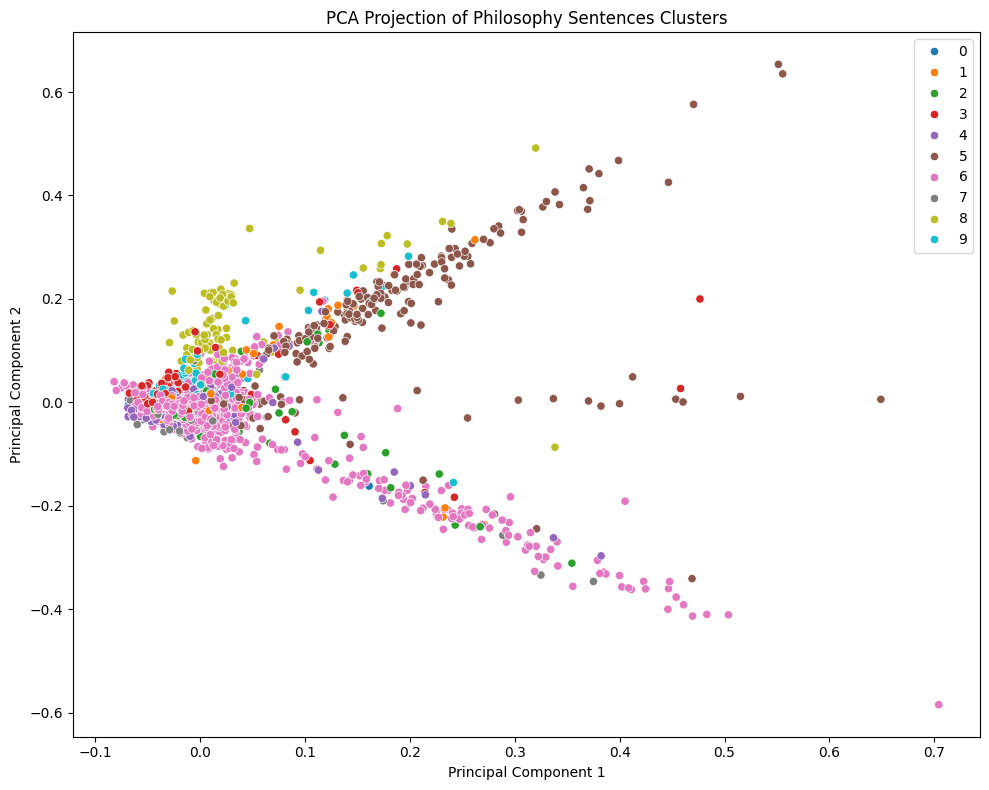

In [ ]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
X_reduced = pca.fit_transform(X.toarray())  # Convert sparse matrix to dense for PCA

plt.figure(figsize=(10, 8))
sns.scatterplot(x=X_reduced[:, 0], y=X_reduced[:, 1], hue=clusters, palette='tab10', legend='full')
plt.title("PCA Projection of Philosophy Sentences Clusters")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.tight_layout()
plt.savefig("philosophy_clusters.png")
plt.show()


To further interpret the clustering result, I first extract the top TF-IDF terms for each cluster by averaging the TF-IDF values across all sentences in that cluster and identifying the most significant words. I print the top 5 words per cluster to see the key themes or topics that characterize each cluster. Additionally, I analyze the top authors and top schools within each cluster by counting occurrences and identifying the most frequent ones. These results give insights into the authors and schools that are most represented within each cluster

In [ ]:
import numpy as np
import pandas as pd

feature_names = vectorizer.get_feature_names_out()

tfidf_df = pd.DataFrame(X.toarray(), columns=feature_names)
tfidf_df['cluster'] = clusters  

top_terms_per_cluster = {}

for cluster_num in range(num_clusters):
    cluster_subset = tfidf_df[tfidf_df['cluster'] == cluster_num].drop(columns=['cluster'])
    top_terms = cluster_subset.mean().sort_values(ascending=False).head(10)
    top_terms_per_cluster[cluster_num] = top_terms

for cluster, terms in top_terms_per_cluster.items():
    top_words = ", ".join(terms.index[:5]) 
    print(f"Cluster {cluster}: {top_words}")




Cluster 0: labourers, seek, make, consist, place
Cluster 1: world, self, possible, experience, consciousness
Cluster 2: think, mind, people, given, ideas
Cluster 3: time, body, space, soul, place
Cluster 4: nature, form, merely, state, forms
Cluster 5: things, thing, way, say, good
Cluster 6: say, does, man, way, different
Cluster 7: like, use, think, people, say
Cluster 8: said, things, book, man, socrates
Cluster 9: know, did, don, good, things


In [ ]:
sample_df = texts_df[['sentence_str', 'author', 'school']].dropna().sample(5000, random_state=42)

vectorizer = TfidfVectorizer(stop_words='english', max_features=1000)
X = vectorizer.fit_transform(sample_df['sentence_str'])  # Use 'sentence_str' for clustering

num_clusters = 10
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
clusters = kmeans.fit_predict(X)

sample_df['cluster'] = clusters  
sample_df.rename(columns={'sentence_str': 'sentence'}, inplace=True)  # Ensure column names are aligned


In [ ]:
for cluster_id in range(num_clusters):
    cluster_authors = sample_df[sample_df['cluster'] == cluster_id]['author']

    author_counts = cluster_authors.value_counts()

    top_authors = author_counts.head(5).items()

    print(f"Cluster {cluster_id}: Top 5 Authors - {list(top_authors)}")

Cluster 0: Top 5 Authors - [('Marx', 7), ('Ricardo', 3), ('Smith', 3), ('Plato', 2), ('Malebranche', 2)]
Cluster 1: Top 5 Authors - [('Hegel', 24), ('Merleau-Ponty', 22), ('Lewis', 17), ('Heidegger', 15), ('Husserl', 14)]
Cluster 2: Top 5 Authors - [('Plato', 43), ('Malebranche', 28), ('Locke', 26), ('Kant', 17), ('Aristotle', 13)]
Cluster 3: Top 5 Authors - [('Aristotle', 37), ('Plato', 26), ('Marx', 15), ('Hegel', 15), ('Beauvoir', 12)]
Cluster 4: Top 5 Authors - [('Hegel', 29), ('Kant', 27), ('Aristotle', 21), ('Foucault', 18), ('Deleuze', 12)]
Cluster 5: Top 5 Authors - [('Aristotle', 60), ('Plato', 40), ('Hegel', 13), ('Locke', 12), ('Heidegger', 11)]
Cluster 6: Top 5 Authors - [('Aristotle', 488), ('Plato', 355), ('Hegel', 223), ('Deleuze', 164), ('Foucault', 151)]
Cluster 7: Top 5 Authors - [('Plato', 16), ('Aristotle', 13), ('Nietzsche', 11), ('Wittgenstein', 6), ('Beauvoir', 5)]
Cluster 8: Top 5 Authors - [('Plato', 33), ('Aristotle', 12), ('Wittgenstein', 6), ('Leibniz', 6), 

In [24]:
from collections import Counter

for cluster_id in range(num_clusters):
    cluster_schools = sample_df[sample_df['cluster'] == cluster_id]['school']
    
    school_counts = Counter(cluster_schools)
    
    common_schools = school_counts.most_common(5)
    
    print(f"Cluster {cluster_id}: Top 5 Schools - {common_schools}")


Cluster 0: Top 5 Schools - [('communism', 7), ('capitalism', 6), ('rationalism', 3), ('german_idealism', 2), ('continental', 2)]
Cluster 1: Top 5 Schools - [('phenomenology', 51), ('german_idealism', 37), ('analytic', 31), ('continental', 14), ('feminism', 9)]
Cluster 2: Top 5 Schools - [('plato', 43), ('empiricism', 38), ('analytic', 37), ('rationalism', 33), ('german_idealism', 29)]
Cluster 3: Top 5 Schools - [('aristotle', 37), ('plato', 26), ('german_idealism', 26), ('phenomenology', 20), ('continental', 20)]
Cluster 4: Top 5 Schools - [('german_idealism', 63), ('continental', 35), ('aristotle', 21), ('rationalism', 16), ('analytic', 15)]
Cluster 5: Top 5 Schools - [('aristotle', 60), ('plato', 40), ('rationalism', 28), ('analytic', 25), ('german_idealism', 22)]
Cluster 6: Top 5 Schools - [('analytic', 601), ('aristotle', 488), ('german_idealism', 412), ('continental', 386), ('plato', 355)]
Cluster 7: Top 5 Schools - [('plato', 16), ('analytic', 16), ('aristotle', 13), ('nietzsche'

Interpretation of clustering:

The clusters represent different philosophical topics and concerns. For example, the schools associated with cluster 0 include communism and capitalism, and terms like "labourers," "seek," and "place," suggest a focus on political and social themes. On the other hand, with terms like "time," "body," "soul," and "space," cluster 3 seems to focus on metaphysical and ontological questions about existence and the nature of reality. This cluster includes schools like aristotle, german_idealism, and phenomenology focusing on the discussions on human existence and the material world.

The top philosophers and schools within each cluster reflect their intellectual influences on these themes. For example, Hegel, Kant, and Aristotle are central to multiple clusters, reflecting their broad influence across different areas of philosophy.

This analysis helps create a clearer picture of how specific philosophers, schools, and ideas are interconnected and can be interpreted as groups of philosophical themes that evolve over time. 

Network Analysis

In the following steps, I focused on visualizing the network of philosophers. Since the full graph was too dense and complex to interpret due to a large number of edges and nodes, I created a subgraph consisting of only the top 10 nodes with the highest degree centrality. By sorting the degree centrality values, I identified the most influential philosophers in the network and displayed their degree centrality scores. I then created a visualization of this subgraph, where each philosopher is represented by a node, and the edges between them are displayed with varying thickness. 

I attempted to scale the node sizes based on their degree centrality, but the differences are not very noticeable due to the small variations in their centrality values. Additionally, I plotted the edge thickness according to the weight of influence, but since the weight in the dataset is uniformly 1, there is no noticeable difference in the visualization. Despite this, I chose to keep the weight column for reference.

In [30]:
G = nx.DiGraph()

for idx, row in network_df.iterrows():
    source = row['A']
    target = row['B']
    weight = row['Weight']
    G.add_edge(source, target, weight=weight)

print("Number of nodes in network:", G.number_of_nodes())
print("Number of edges in network:", G.number_of_edges())


Number of nodes in network: 1694
Number of edges in network: 2336


Top 10 most influential philosophers:
Georg_Wilhelm_Friedrich_Hegel 's Degree Centrality: 0.039574719432959246
Arthur_Schopenhauer 's Degree Centrality: 0.03307737743650325
Friedrich_Nietzsche 's Degree Centrality: 0.03071470761961016
Immanuel_Kant 's Degree Centrality: 0.02835203780271707
Karl_Marx 's Degree Centrality: 0.025398700531600708
S%C3%B8ren_Kierkegaard 's Degree Centrality: 0.022445363260484345
David_Hume 's Degree Centrality: 0.022445363260484345
Edmund_Husserl 's Degree Centrality: 0.021854695806261076
Baruch_Spinoza 's Degree Centrality: 0.021264028352037802
Jean-Jacques_Rousseau 's Degree Centrality: 0.02067336089781453


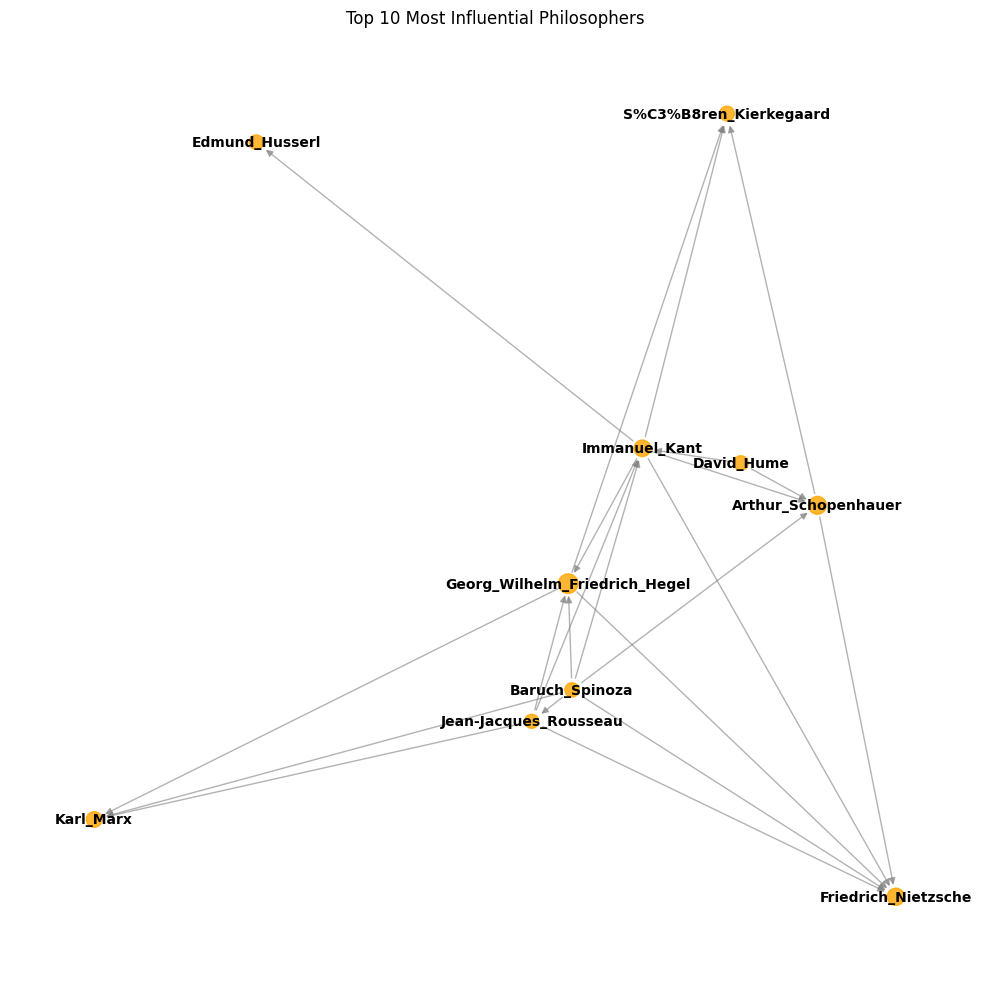

In [40]:
import networkx as nx
import matplotlib.pyplot as plt
import pandas as pd

degree_centrality = nx.degree_centrality(G)
top_10_nodes = sorted(degree_centrality, key=degree_centrality.get, reverse=True)[:10]

G_top = G.subgraph(top_10_nodes).copy()

print("Top 10 most influential philosophers:")
for philosopher in top_10_nodes:
    print(philosopher, "'s Degree Centrality:", degree_centrality[philosopher])

plt.figure(figsize=(10, 10))
pos = nx.spring_layout(G_top, k=0.3, iterations=50)

node_sizes = [degree_centrality[node] * 5000 for node in G_top.nodes()]

nx.draw_networkx_nodes(G_top, pos, node_size=node_sizes, node_color='orange', alpha=0.8)
nx.draw_networkx_edges(G_top, pos, alpha=0.6, edge_color='gray')
nx.draw_networkx_labels(G_top, pos, font_size=10, font_weight='bold')

plt.title("Top 10 Most Influential Philosophers")
plt.axis('off')
plt.tight_layout()
plt.savefig("top_10_philosophers.png") 
plt.show()

Timeline of Philosophical Themes

Next, I created an interactive timeline to visualize the progression of philosophical schools. The dataset was first cleaned by removing rows with missing publication dates. I generated a scatter plot where the x-axis represents the publication dates, the y-axis lists the authors, and different colors indicate the philosophical schools associated with each author. This interactive visualization allows users to explore the temporal distribution of philosophical publications, with the ability to hover over points for more details about each publication. The timeline also facilitates the comparison of philosophical schools over time.

In [1]:
import pandas as pd
import plotly.express as px

philo_df = pd.read_csv("philosophy_data.csv", parse_dates=["original_publication_date"])

philo_df = philo_df.dropna(subset=["original_publication_date"])

fig = px.scatter(philo_df, 
                 x="original_publication_date", 
                 y="author", 
                 color="school",
                 title="Timeline of Philosophical Publications by School",
                 labels={"original_publication_date": "Publication Date", "author": "Philosopher"})
fig.show()


/var/folders/fh/vksg8g1j6717f_z0rt246t540000gn/T/ipykernel_1230/450399573.py:4: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  philo_df = pd.read_csv("philosophy_data.csv", parse_dates=["original_publication_date"])


Word Cloud

I used word clouds to visualize the most frequent terms associated with each philosophical school in the dataset. After cleaning the data and filtering out missing values for the school column, I generated a separate word cloud for each school. I used the lemmatized_str column to represent the text for each school, ensuring that words were standardized to their root forms. The initial result has "pron" as the most common word in each word cloud, which might be an error since the word does not mean anything. Therefore, I customized the stopwords to exclude the word "pron," which obscure the meaningful terms.

The resulting word clouds highlight the most prominent concepts and terms associated with each philosophical school, offering a clear and visual way to identify the key themes that define different philosophical traditions. This contributes to understanding the focus of each school, revealing patterns in the language used by authors from these schools. By comparing word clouds across schools, you can gain insights into the differing emphases and intellectual concerns of various philosophical movements.

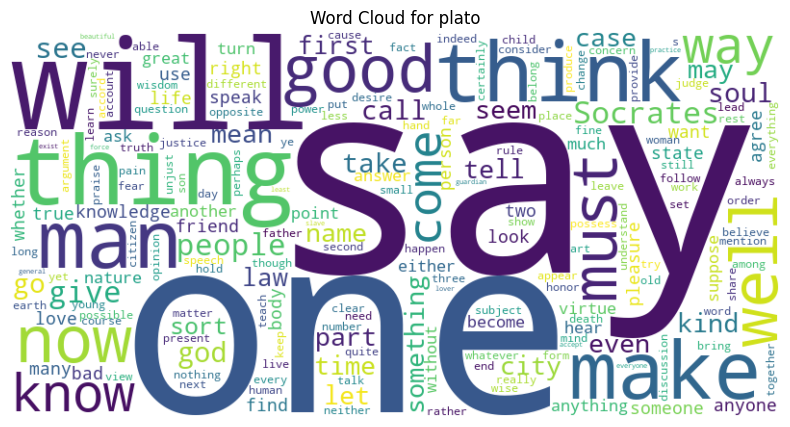

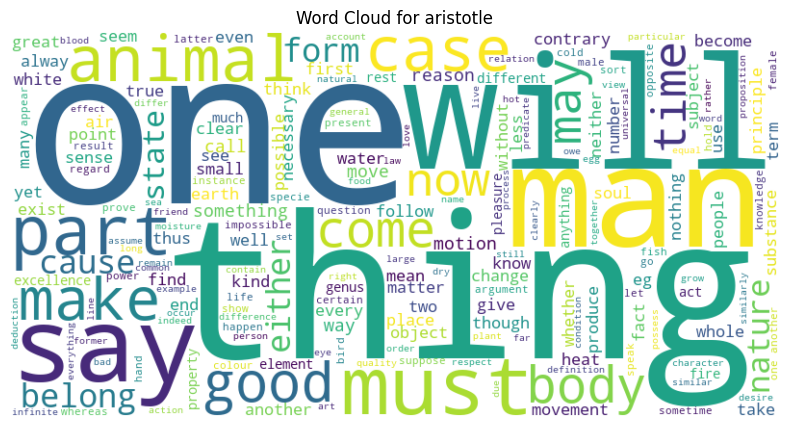

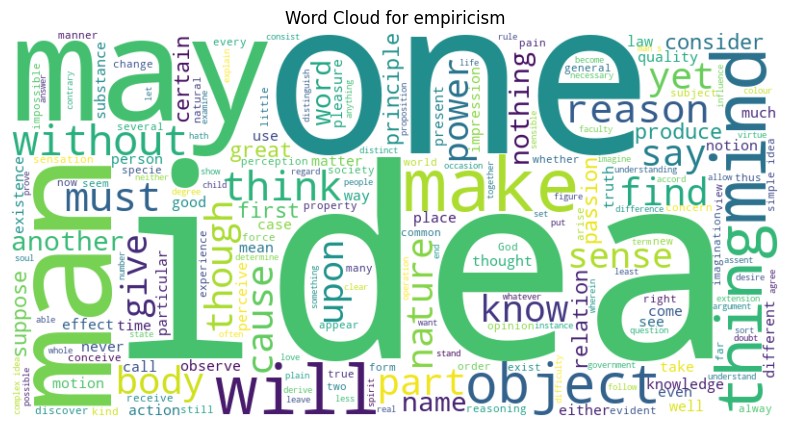

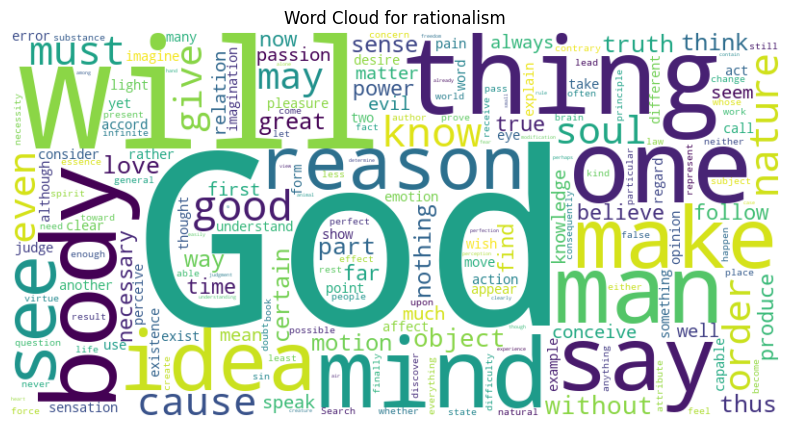

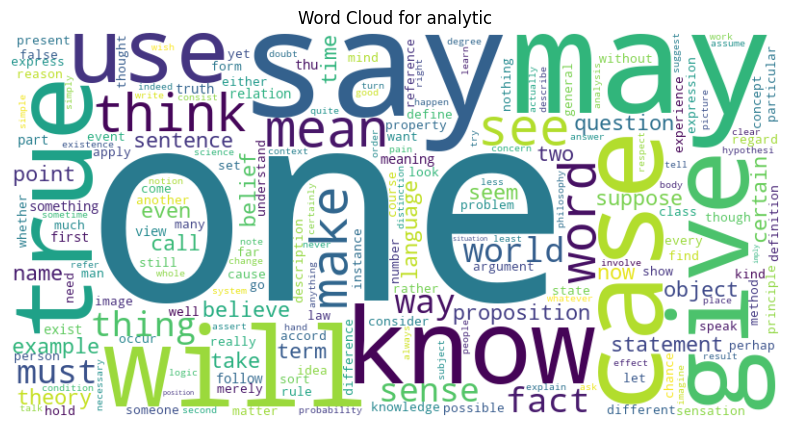

...

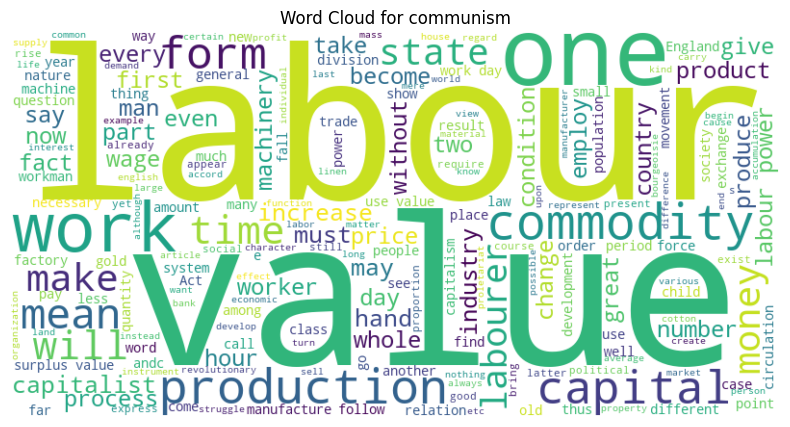

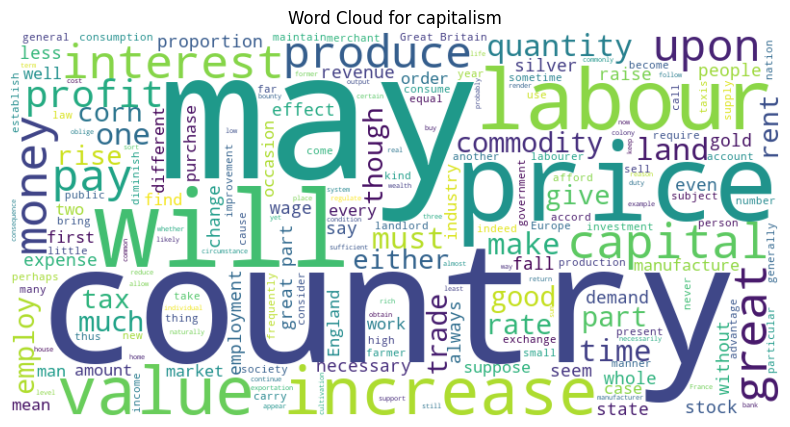

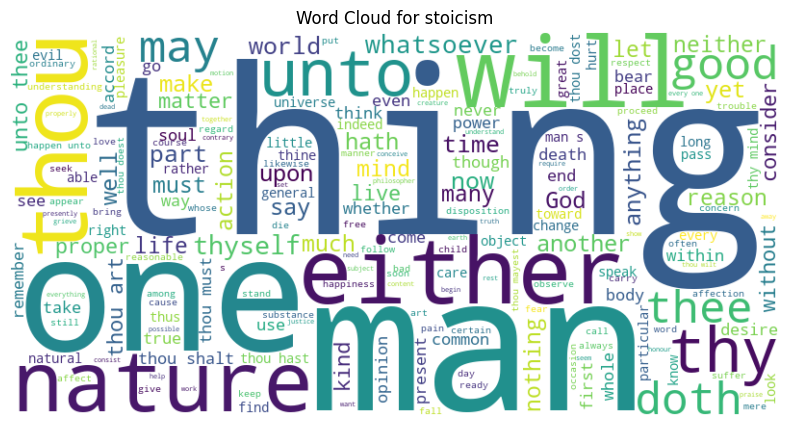

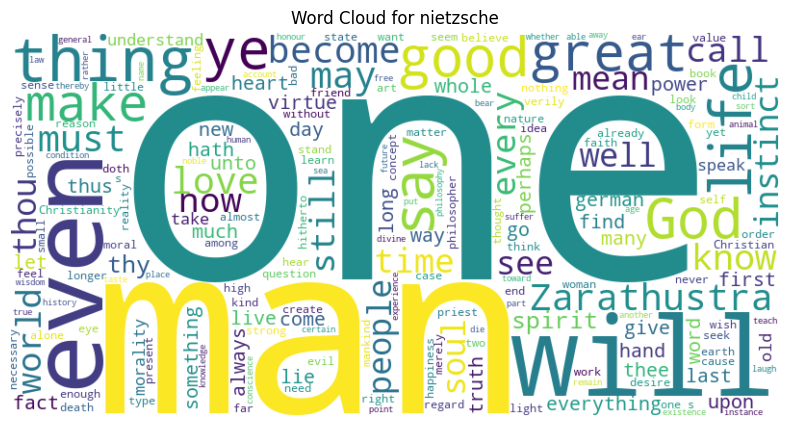

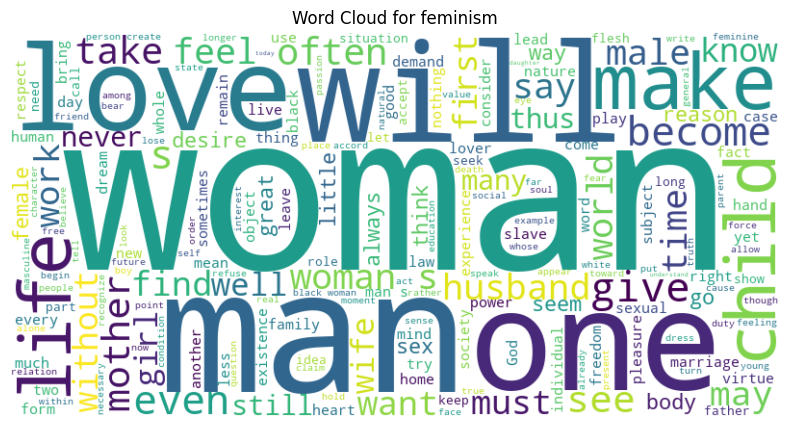

In [ ]:
import pandas as pd
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt

philo_df = pd.read_csv("philosophy_data.csv")

schools = philo_df["school"].dropna().unique()

custom_stopwords = set(STOPWORDS)
custom_stopwords.add("pron")

for school in schools:
    school_text = " ".join(philo_df[philo_df["school"] == school]["lemmatized_str"].dropna())
    wc = WordCloud(width=800, height=400, background_color="white", stopwords=custom_stopwords).generate(school_text)
    
    plt.figure(figsize=(10, 5))
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.title(f"Word Cloud for {school}")
    plt.show()



Sentiment Analysis

Finally, I analyzed the sentiment of philosophical texts over time by computing the sentiment polarity of each sentence in the dataset. Using the TextBlob library, I calculated the sentiment polarity score for each sentence, which ranges from -1 (negative sentiment) to +1 (positive sentiment). Then, I aggregated the sentiment scores by publication date, which tracks how the overall sentiment of philosophical works has changed over time.

In [ ]:
import pandas as pd
from textblob import TextBlob
import plotly.express as px

philo_df = pd.read_csv("philosophy_data.csv", parse_dates=["original_publication_date"])
philo_df = philo_df.dropna(subset=["original_publication_date", "sentence_str"])

philo_df["sentiment"] = philo_df["sentence_str"].apply(lambda text: TextBlob(text).sentiment.polarity)

sentiment_by_date = philo_df.groupby("original_publication_date")["sentiment"].mean().reset_index()

fig = px.line(sentiment_by_date, 
              x="original_publication_date", 
              y="sentiment",
              title="Average Sentiment Over Time",
              labels={"original_publication_date": "Publication Date", "sentiment": "Average Sentiment"})
fig.show()


/var/folders/fh/vksg8g1j6717f_z0rt246t540000gn/T/ipykernel_54035/2384071892.py:6: UserWarning:

Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.



Interpretation

The sentiment analysis reveals interesting patterns over time. The highest sentiment score in 1637 suggests that philosophical works published around this time may have a more positive or optimistic tone. This could be interpreted in the context of significant intellectual movements of the time, such as the rise of early modern philosophy with figures like René Descartes and the flourishing of rationalism. The positive sentiment might reflect a period of intellectual optimism and discovery.

On the other hand, the lowest sentiment scores in 1953 and 1961 are notable. These years could be indicative of times of social or political turbulence, particularly in the mid-20th century when global events like World War II and the Cold War were heavily influencing philosophical discourse. Philosophers may have been grappling with the aftermath of war, existential crises, or concerns about modernity and human existence, which could explain the more negative sentiment during these periods.

The general trend of gradual decreasing sentiment could suggest that over time, philosophy may have become more critical or reflective of societal issues, possibly influenced by major historical events, such as wars, industrialization, and the questioning of traditional values. This decline may point to a shift toward more critical, existential, and sometimes pessimistic philosophical inquiries, especially as modernity and its challenges began to shape intellectual thought in the 19th and 20th centuries.

While the trend is slowly decreasing, the average sentiment is relatively stable and positive. It could be reflective of the inherent nature of philosophical discourse. Despite dealing with complex and often challenging topics, philosophers often strive to seek understanding, enlightenment, or solutions, leading to an overall positive outlook.